In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 512), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  598.68 2.89067 0.281574


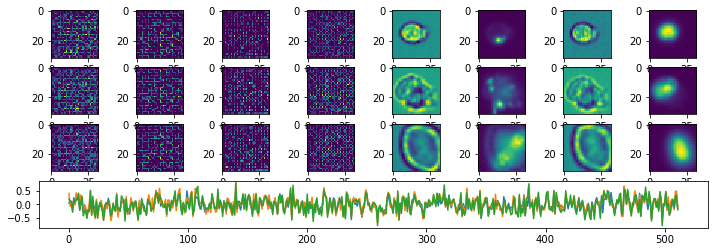

Epoch:  1 Iteration:  0 Loss:  20.9174 0.639149 0.00154755


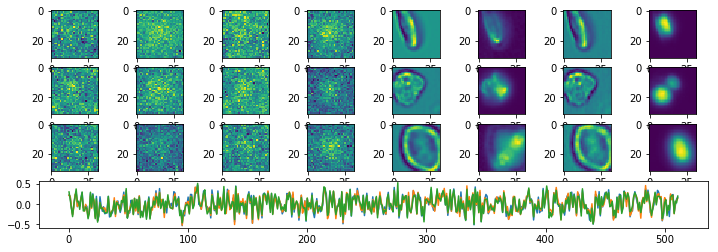

Epoch:  2 Iteration:  0 Loss:  15.3449 0.636207 0.000760585


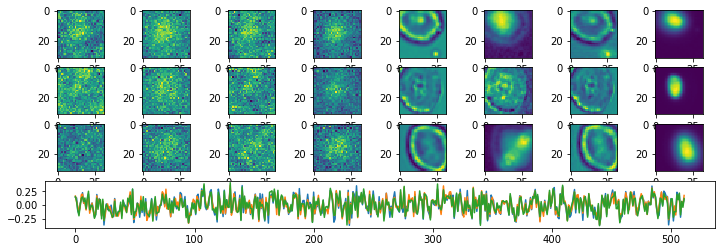

Epoch:  3 Iteration:  0 Loss:  14.1168 0.635548 2.45273e-05


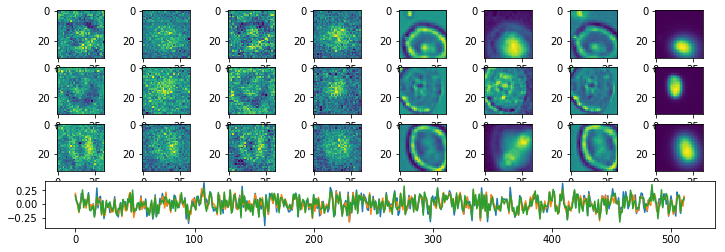

Epoch:  4 Iteration:  0 Loss:  11.9549 0.634497 0.00240788


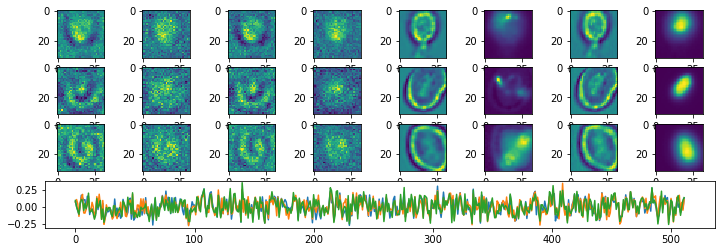

Epoch:  5 Iteration:  0 Loss:  11.517 0.634264 0.00264013


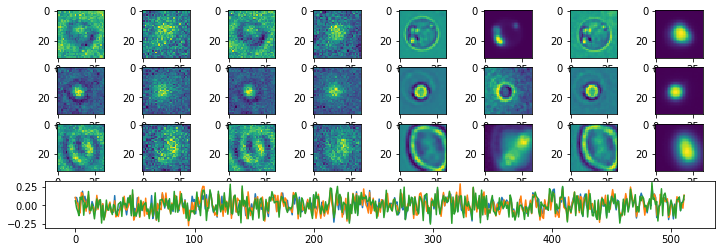

Epoch:  6 Iteration:  0 Loss:  8.98699 0.632903 0.001349


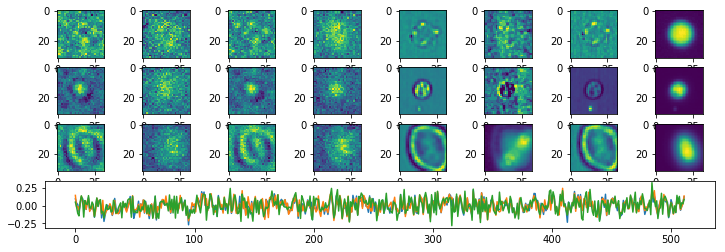

Epoch:  7 Iteration:  0 Loss:  8.24404 0.632511 0.00141379


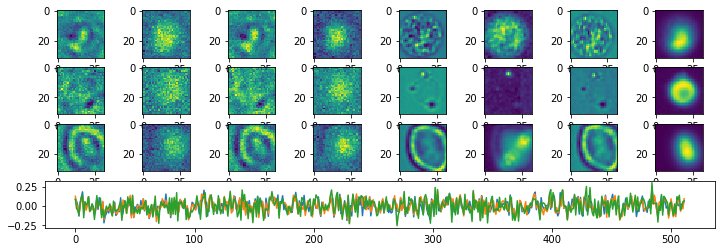

Epoch:  8 Iteration:  0 Loss:  7.58109 0.632154 0.000739634


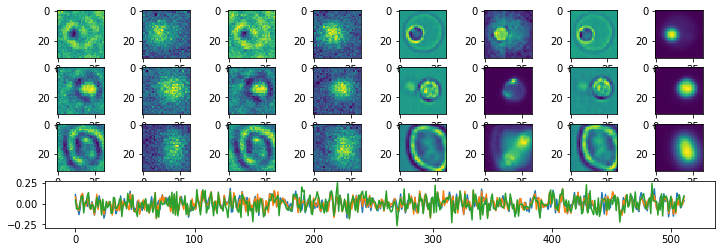

Epoch:  9 Iteration:  0 Loss:  7.27683 0.632 0.00152656


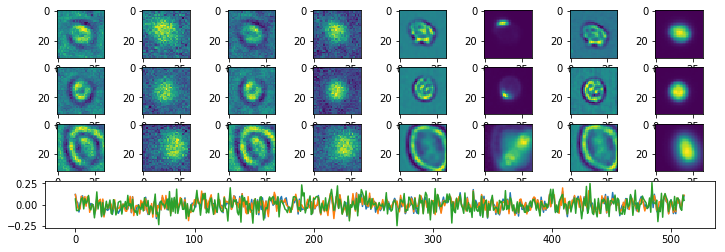

Epoch:  10 Iteration:  0 Loss:  6.66882 0.631677 0.0010474


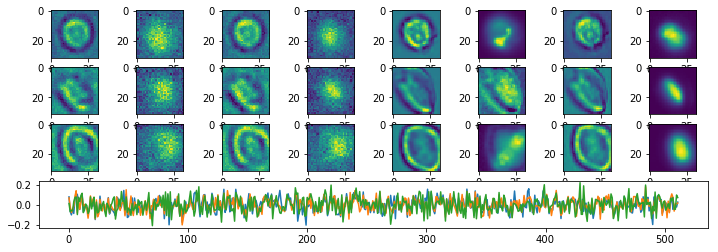

Epoch:  11 Iteration:  0 Loss:  6.43351 0.631554 0.00121617


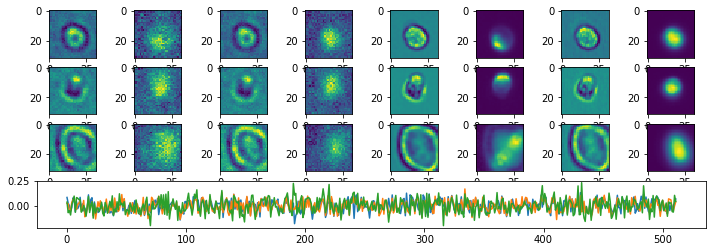

Epoch:  12 Iteration:  0 Loss:  6.10546 0.631378 0.00101852


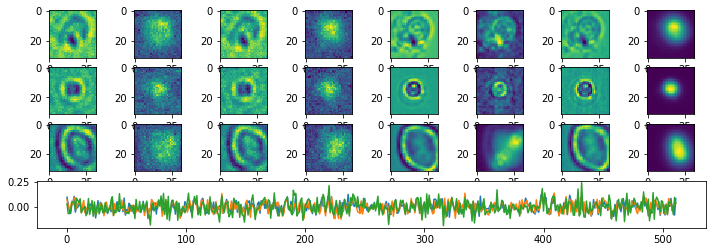

Epoch:  13 Iteration:  0 Loss:  5.86236 0.631251 0.00116938


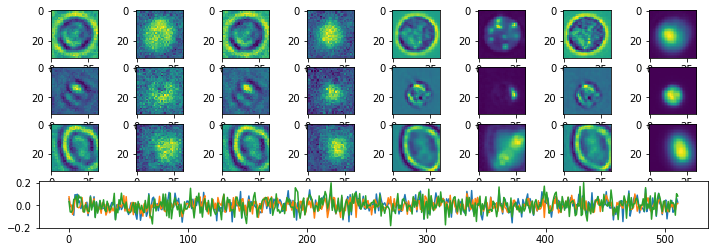

Epoch:  14 Iteration:  0 Loss:  5.62276 0.631123 0.000860542


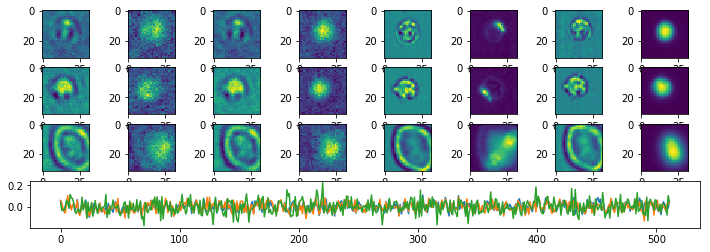

Epoch:  15 Iteration:  0 Loss:  5.37151 0.630989 0.000643671


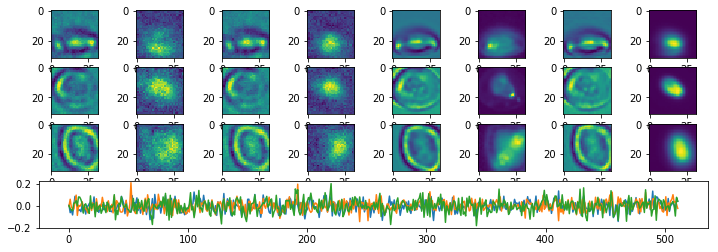

Epoch:  16 Iteration:  0 Loss:  5.11134 0.630848 0.000926703


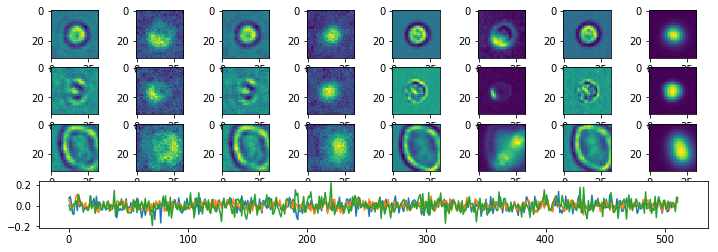

Epoch:  17 Iteration:  0 Loss:  4.99548 0.630787 0.000759572


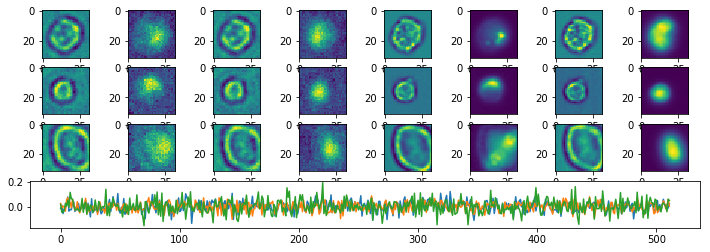

Epoch:  18 Iteration:  0 Loss:  4.75776 0.630659 0.000686109


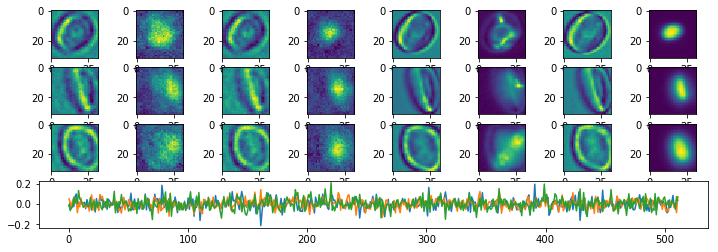

Epoch:  19 Iteration:  0 Loss:  4.65709 0.630607 0.000476658


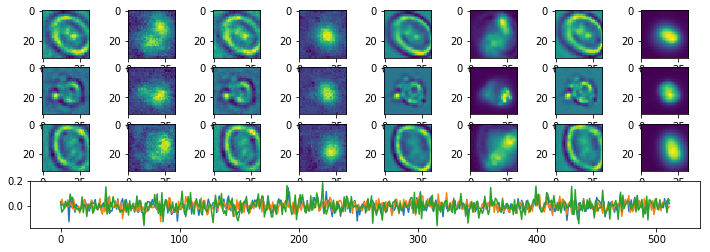

Epoch:  20 Iteration:  0 Loss:  4.52546 0.630537 0.000621408


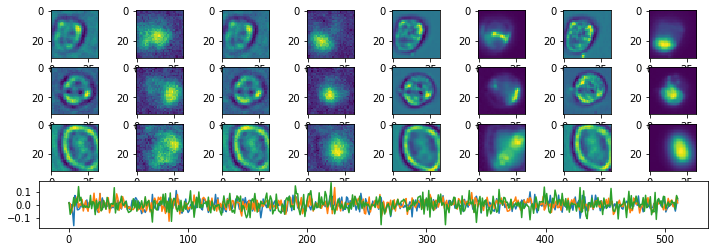

Epoch:  21 Iteration:  0 Loss:  4.4399 0.63049 0.00066331


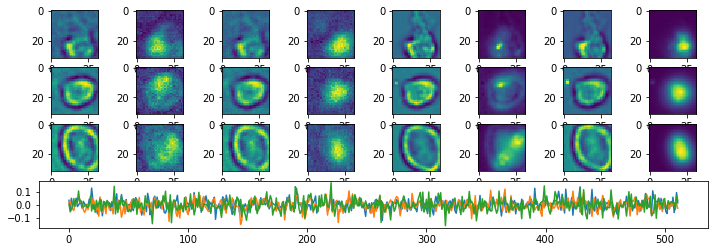

Epoch:  22 Iteration:  0 Loss:  4.29013 0.630411 0.000549078


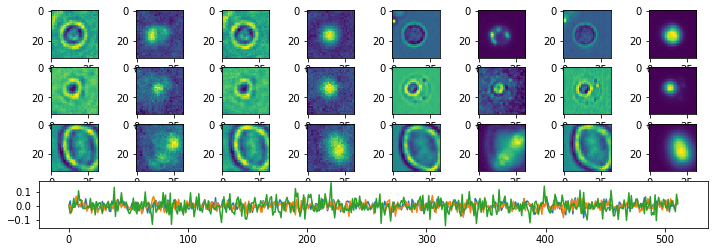

Epoch:  23 Iteration:  0 Loss:  4.20235 0.630365 0.000572592


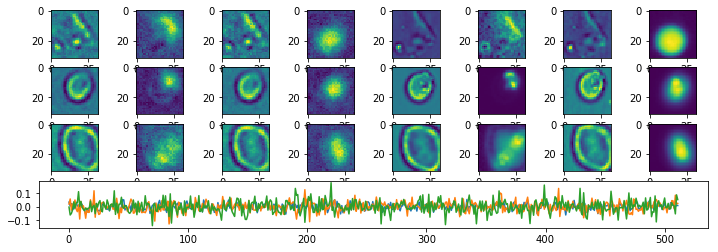

Epoch:  24 Iteration:  0 Loss:  4.12409 0.630324 0.000341445


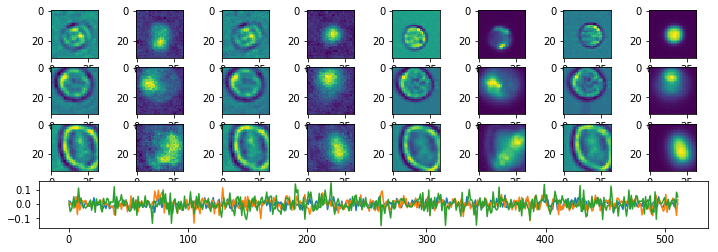

Epoch:  25 Iteration:  0 Loss:  4.02199 0.630269 0.000489622


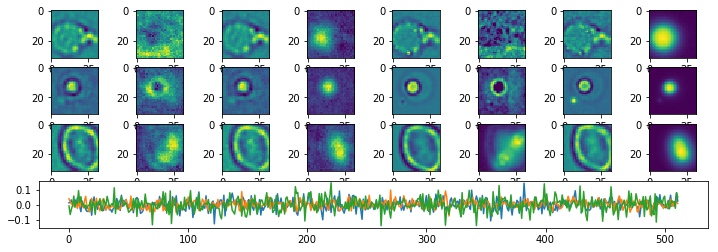

Epoch:  26 Iteration:  0 Loss:  3.96972 0.63024 0.000684261


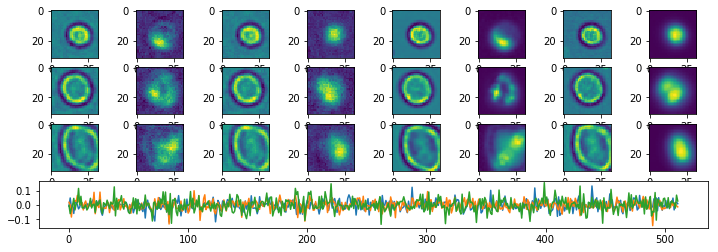

Epoch:  27 Iteration:  0 Loss:  3.87956 0.630193 0.000656992


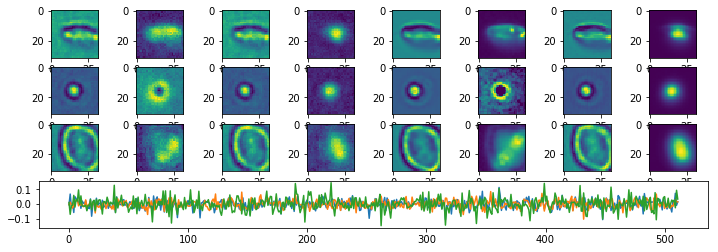

Epoch:  28 Iteration:  0 Loss:  3.82257 0.630164 0.000413686


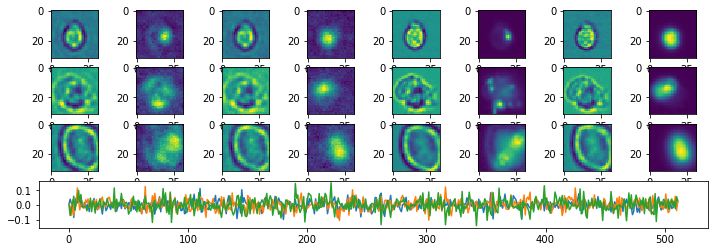

Epoch:  29 Iteration:  0 Loss:  3.76531 0.630132 0.000706911


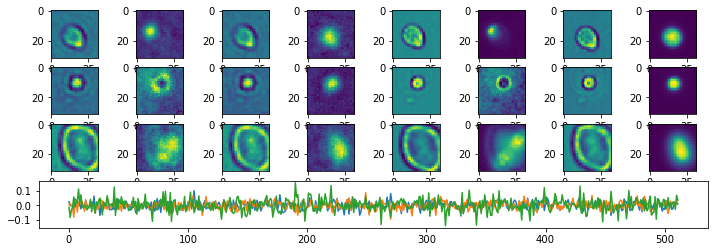

Epoch:  30 Iteration:  0 Loss:  3.77253 0.630137 0.000751764


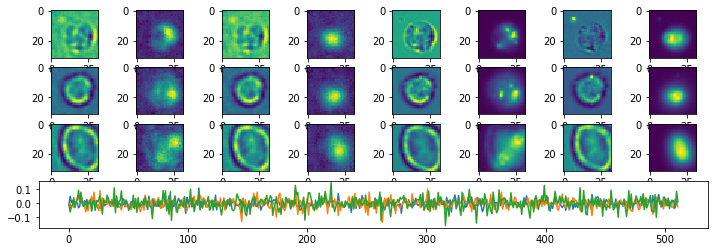

Epoch:  31 Iteration:  0 Loss:  3.6357 0.630065 0.000362366


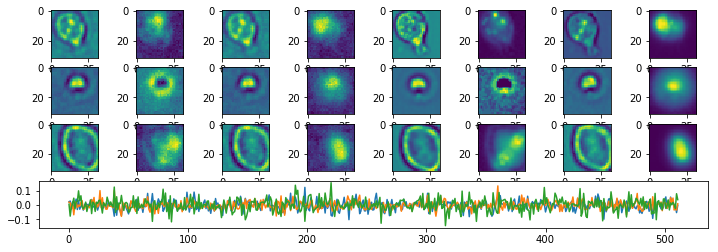

Epoch:  32 Iteration:  0 Loss:  3.56826 0.63003 0.000383228


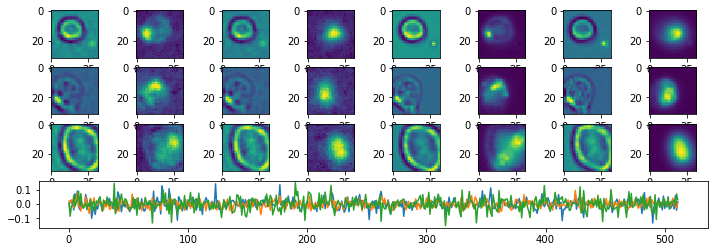

Epoch:  33 Iteration:  0 Loss:  3.53165 0.630011 3.32594e-05


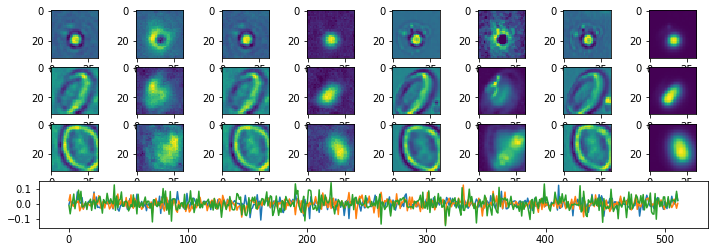

Epoch:  34 Iteration:  0 Loss:  3.42629 0.629957 0.000565857


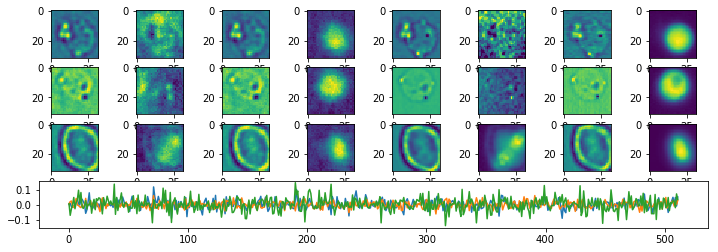

Epoch:  35 Iteration:  0 Loss:  3.37959 0.629932 0.000296742


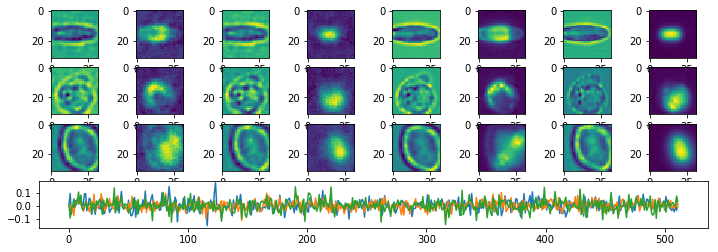

Epoch:  36 Iteration:  0 Loss:  3.34996 0.629918 0.000271797


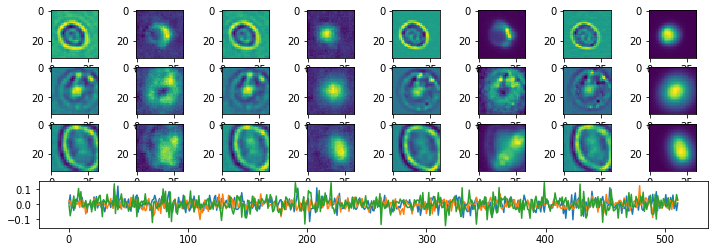

Epoch:  37 Iteration:  0 Loss:  3.26544 0.629874 0.000696212


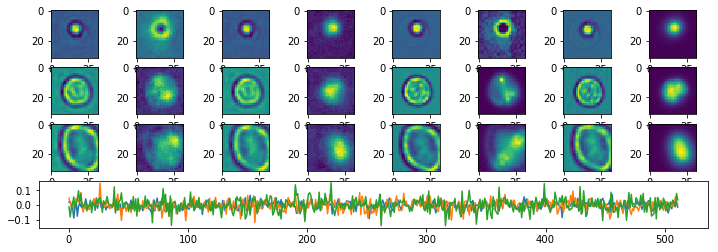

Epoch:  38 Iteration:  0 Loss:  3.23219 0.629856 7.1317e-05


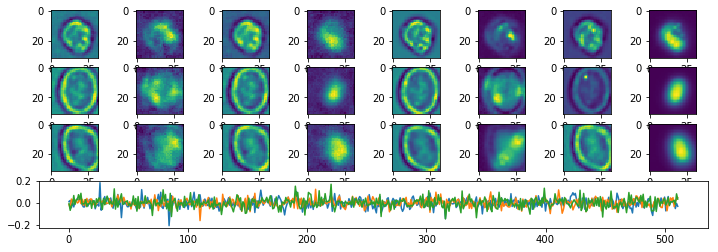

Epoch:  39 Iteration:  0 Loss:  3.19569 0.629837 7.23898e-05


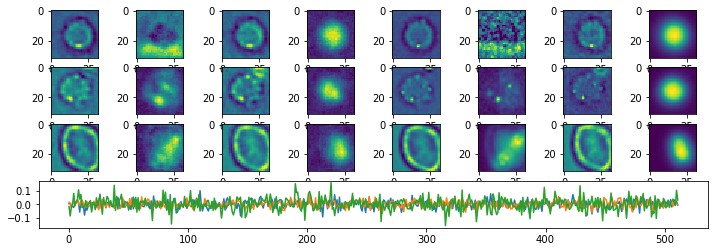

Epoch:  40 Iteration:  0 Loss:  3.16832 0.629823 0.000733733


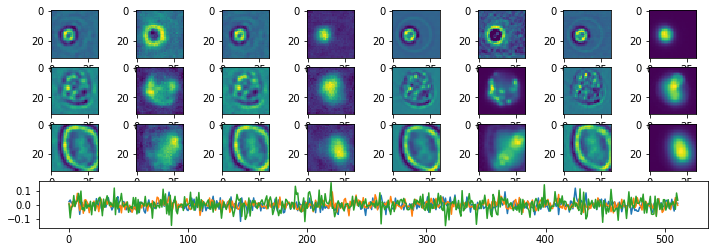

Epoch:  41 Iteration:  0 Loss:  3.09023 0.629782 0.000655055


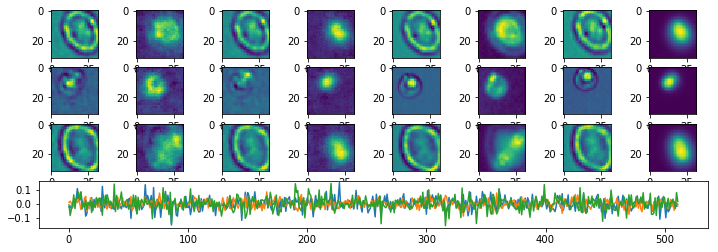

Epoch:  42 Iteration:  0 Loss:  3.06354 0.62977 8.85725e-05


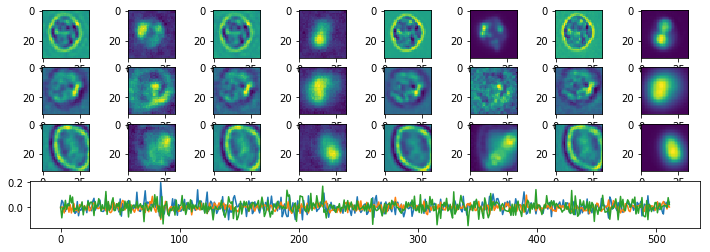

Epoch:  43 Iteration:  0 Loss:  2.99965 0.629735 0.000392824


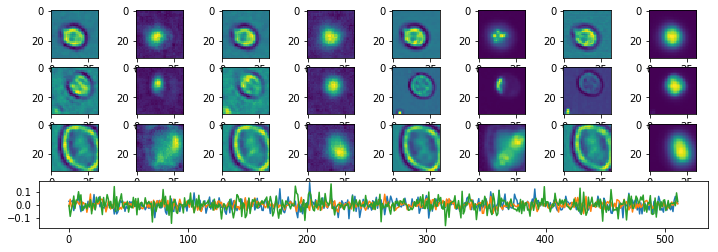

Epoch:  44 Iteration:  0 Loss:  2.96522 0.629718 0.000531435


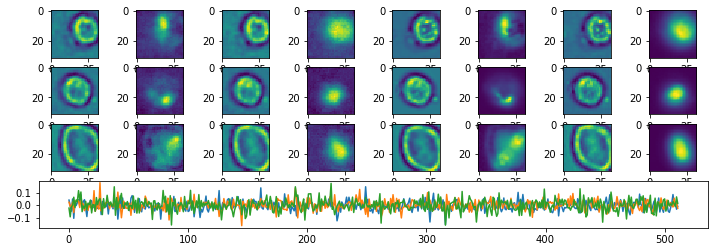

Epoch:  45 Iteration:  0 Loss:  2.91047 0.62969 0.000578582


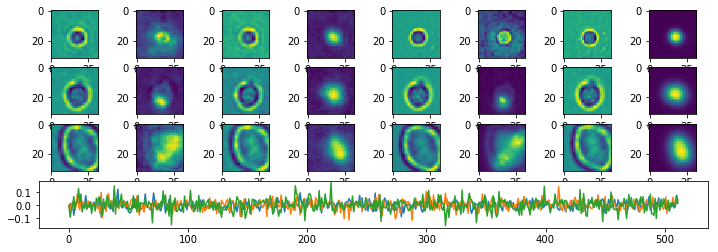

Epoch:  46 Iteration:  0 Loss:  2.88444 0.629676 9.92119e-05


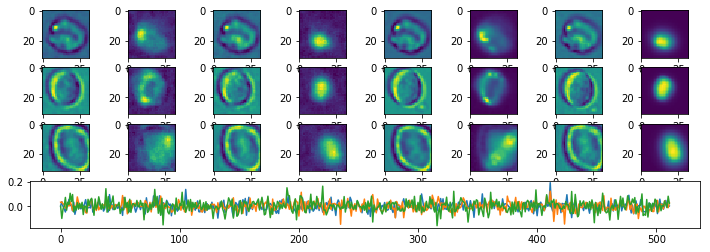

Epoch:  47 Iteration:  0 Loss:  2.83394 0.629653 0.000739694


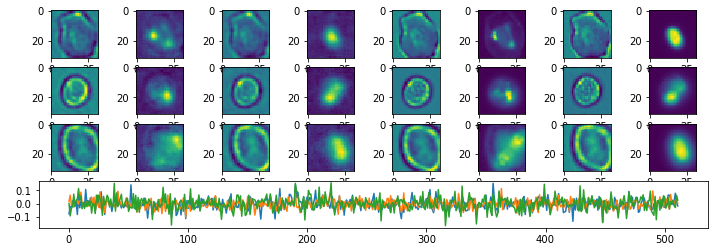

Epoch:  48 Iteration:  0 Loss:  2.80991 0.629638 0.000573248


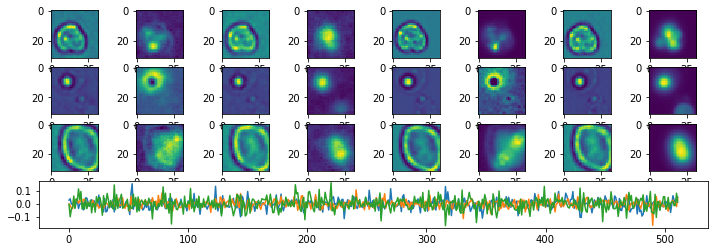

Epoch:  49 Iteration:  0 Loss:  2.76813 0.629617 0.000543475


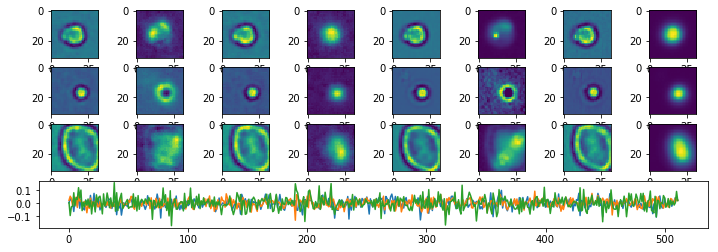

Epoch:  50 Iteration:  0 Loss:  2.72574 0.629595 0.000284284


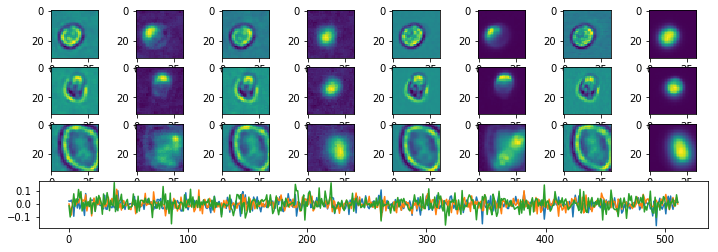

Epoch:  51 Iteration:  0 Loss:  2.6854 0.629574 4.96805e-05


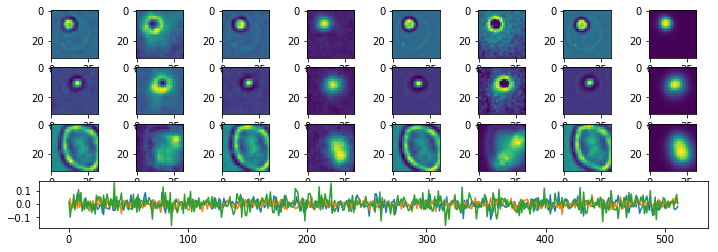

Epoch:  52 Iteration:  0 Loss:  2.67073 0.629567 0.000360399


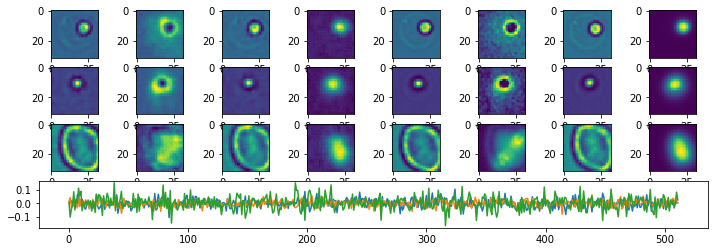

Epoch:  53 Iteration:  0 Loss:  2.62374 0.629542 9.14931e-06


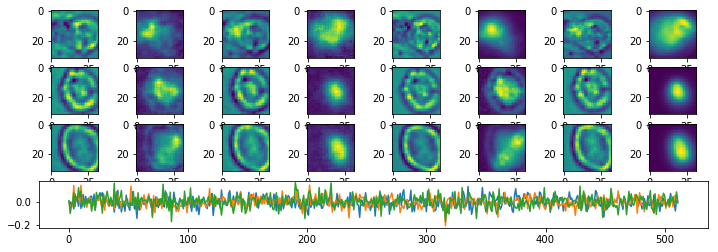

Epoch:  54 Iteration:  0 Loss:  2.60113 0.62953 0.000429451


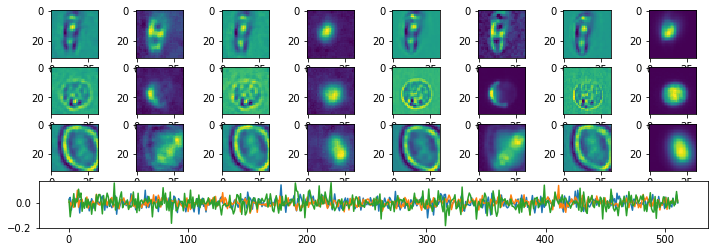

Epoch:  55 Iteration:  0 Loss:  2.71014 0.629594 0.000606835


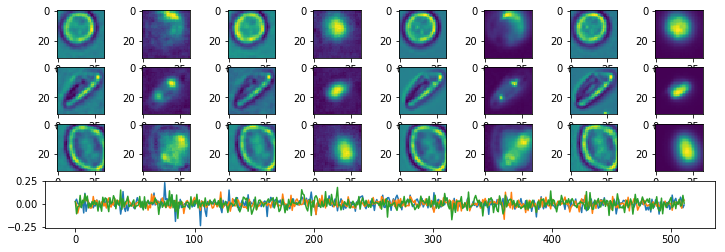

Epoch:  56 Iteration:  0 Loss:  2.53322 0.629495 0.00054875


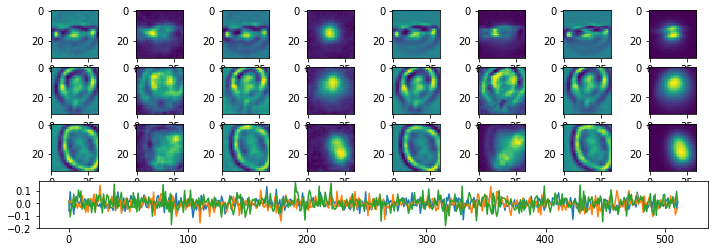

Epoch:  57 Iteration:  0 Loss:  2.5433 0.629501 0.000196218


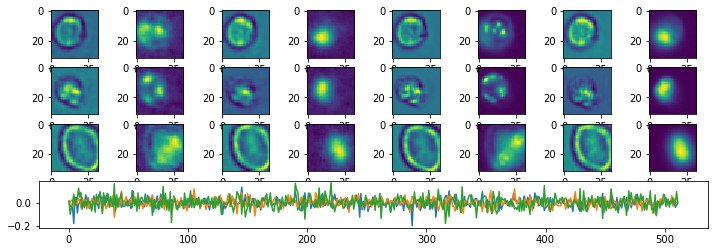

Epoch:  58 Iteration:  0 Loss:  2.53585 0.629501 9.03606e-05


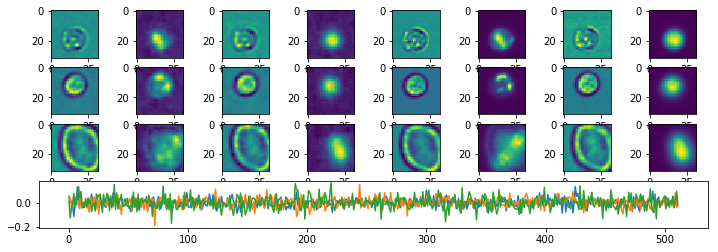

Epoch:  59 Iteration:  0 Loss:  2.49355 0.629475 0.00059703


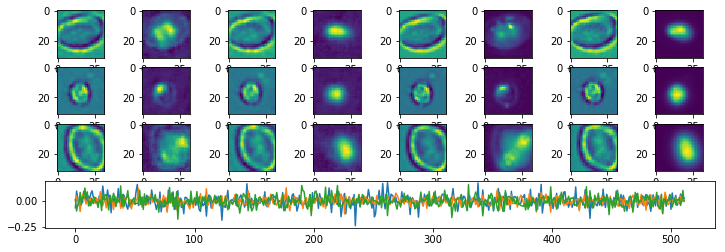

Epoch:  60 Iteration:  0 Loss:  2.46988 0.62947 0.000467449


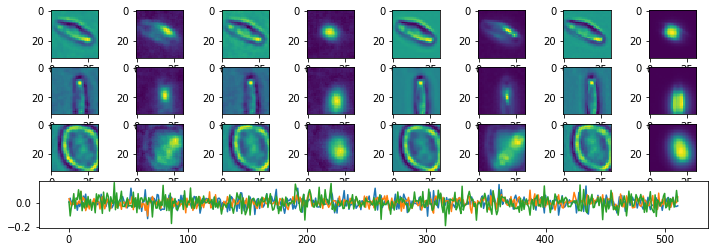

Epoch:  61 Iteration:  0 Loss:  2.43223 0.629444 0.000137299


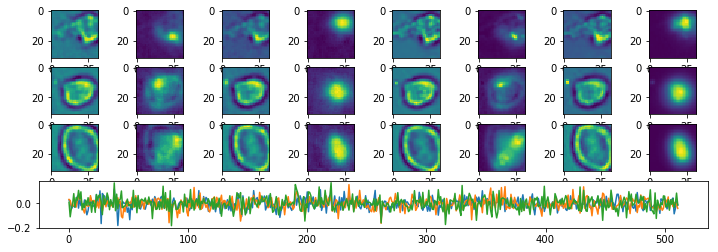

Epoch:  62 Iteration:  0 Loss:  2.40751 0.62943 0.000516266


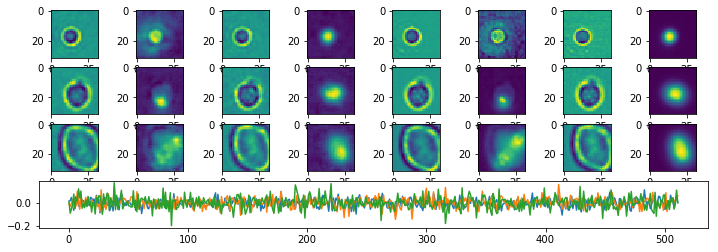

Epoch:  63 Iteration:  0 Loss:  2.41335 0.629436 0.000566214


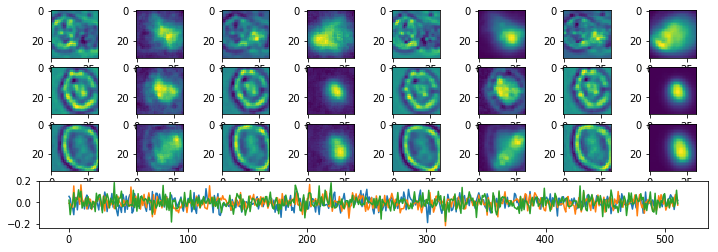

Epoch:  64 Iteration:  0 Loss:  2.3854 0.629419 0.000421375


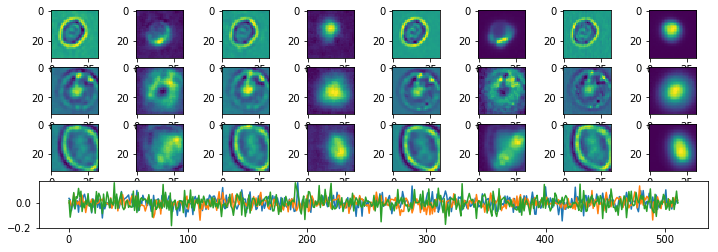

Epoch:  65 Iteration:  0 Loss:  2.35444 0.629403 0.000283211


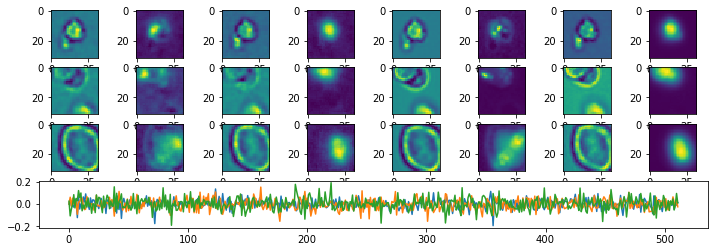

Epoch:  66 Iteration:  0 Loss:  2.34488 0.6294 2.10106e-05


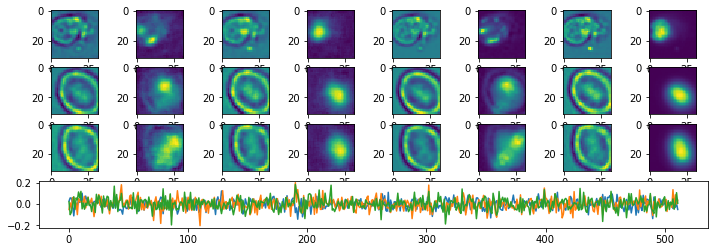

Epoch:  67 Iteration:  0 Loss:  2.32893 0.62939 0.00051707


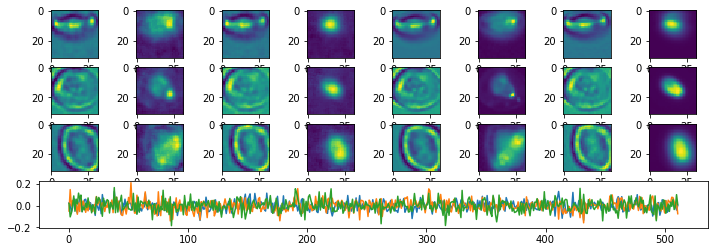

Epoch:  68 Iteration:  0 Loss:  2.32533 0.62939 4.93526e-05


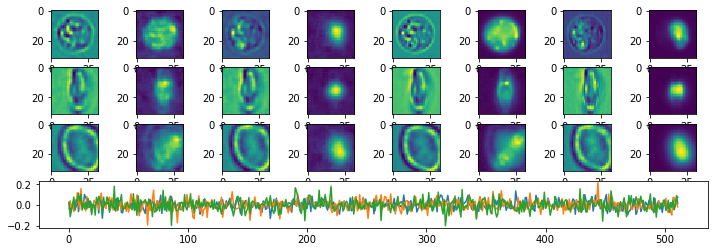

Epoch:  69 Iteration:  0 Loss:  2.29213 0.62938 0.000201255


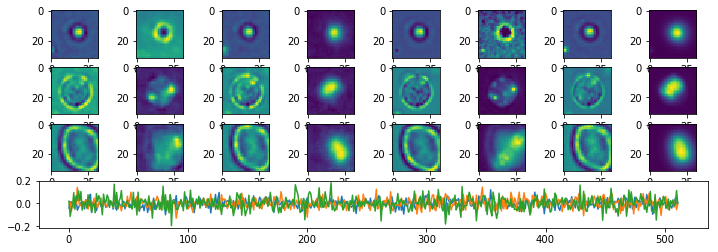

Epoch:  70 Iteration:  0 Loss:  2.26865 0.62936 0.000451326


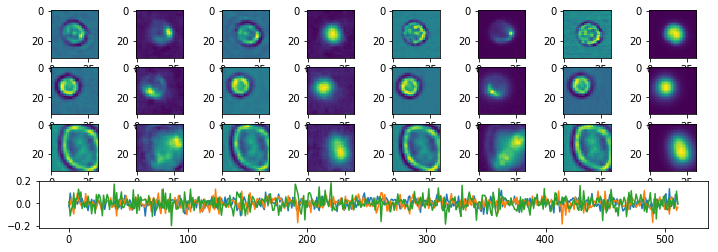

Epoch:  71 Iteration:  0 Loss:  2.26244 0.629357 5.61476e-05


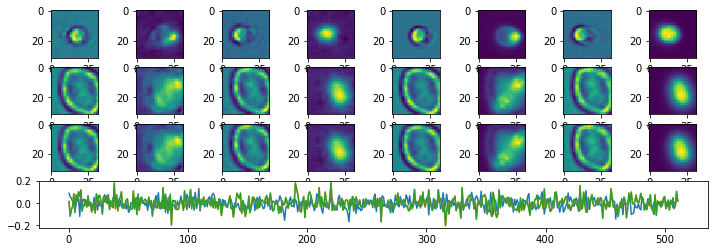

Epoch:  72 Iteration:  0 Loss:  2.24072 0.629344 7.17044e-05


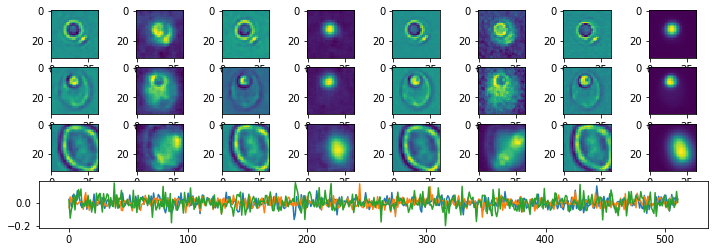

Epoch:  73 Iteration:  0 Loss:  2.22936 0.629342 0.000200331


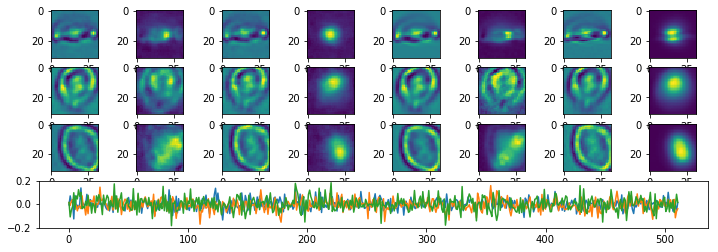

Epoch:  74 Iteration:  0 Loss:  2.20842 0.629329 0.000345498


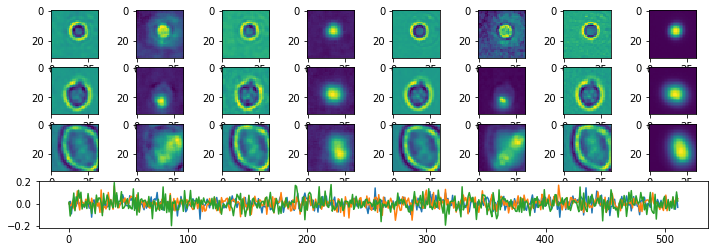

Epoch:  75 Iteration:  0 Loss:  2.25997 0.629354 0.000416815


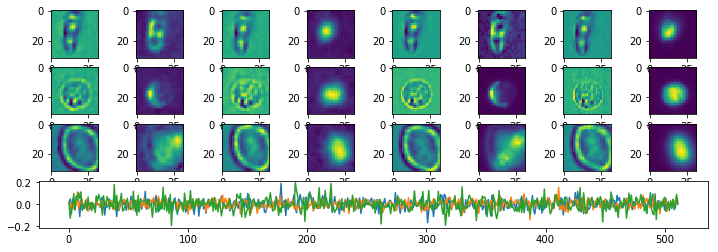

Epoch:  76 Iteration:  0 Loss:  2.19657 0.629322 0.000321358


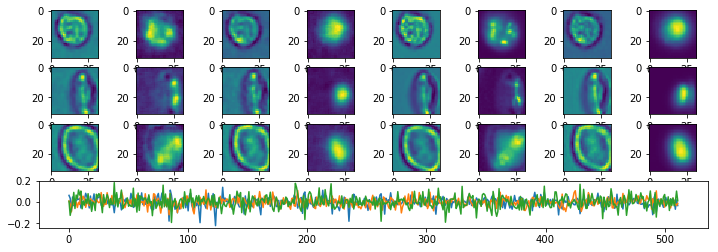

Epoch:  77 Iteration:  0 Loss:  2.18252 0.629314 6.99461e-05


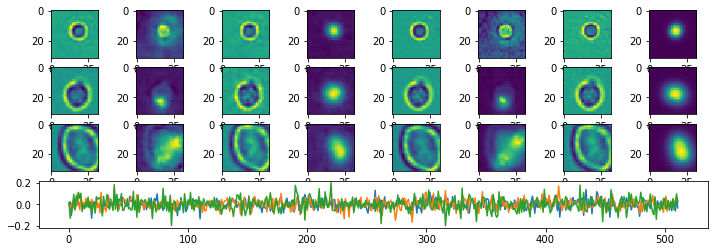

Epoch:  78 Iteration:  0 Loss:  2.18194 0.629316 0.000399292


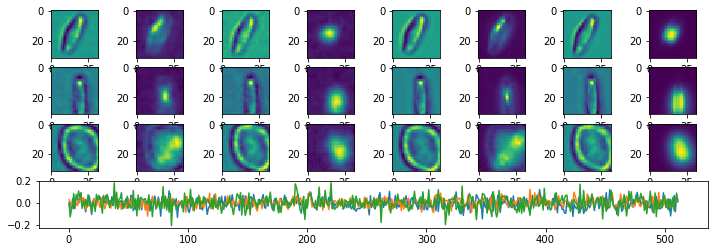

Epoch:  79 Iteration:  0 Loss:  2.16854 0.629307 5.76973e-05


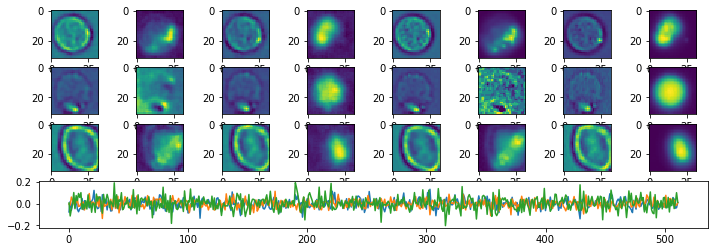

Epoch:  80 Iteration:  0 Loss:  2.15249 0.6293 9.36091e-05


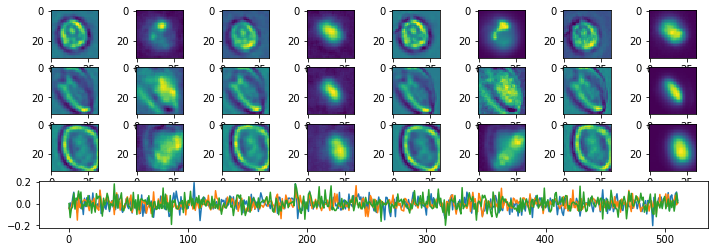

Epoch:  81 Iteration:  0 Loss:  2.15835 0.629305 0.000686616


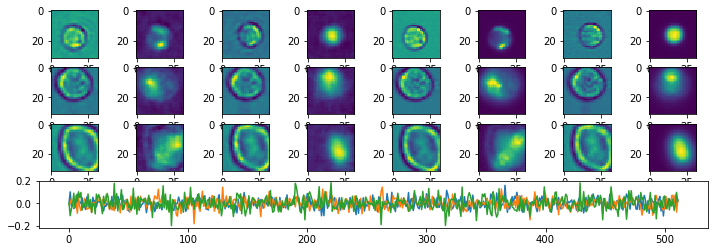

Epoch:  82 Iteration:  0 Loss:  2.15096 0.629298 0.000112593


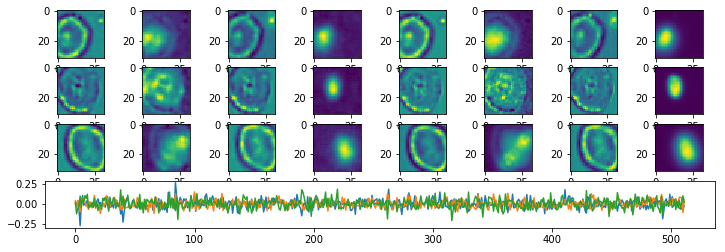

Epoch:  83 Iteration:  0 Loss:  2.15452 0.6293 0.000279248


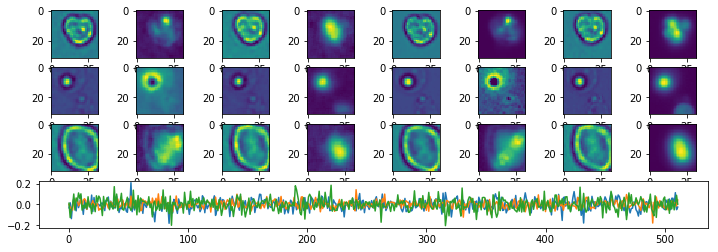

Epoch:  84 Iteration:  0 Loss:  2.12573 0.629285 0.000467747


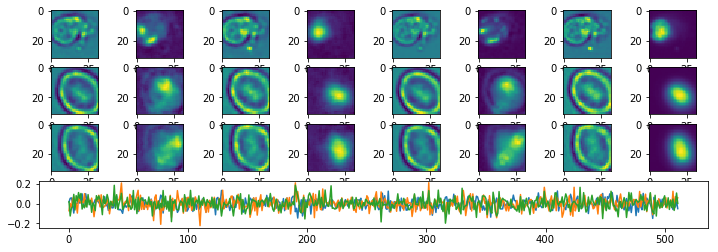

Epoch:  85 Iteration:  0 Loss:  2.11791 0.629282 9.40561e-05


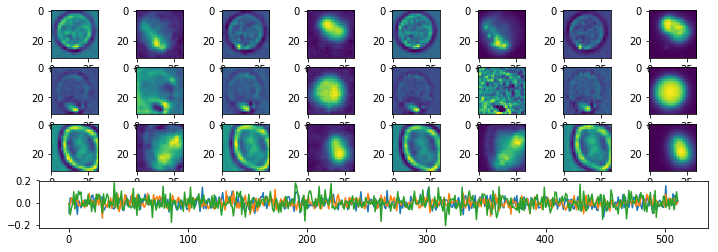

Epoch:  86 Iteration:  0 Loss:  2.11212 0.629277 0.000531584


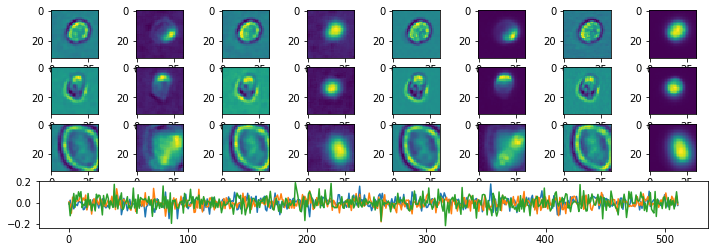

Epoch:  87 Iteration:  0 Loss:  2.08865 0.629265 0.000232965


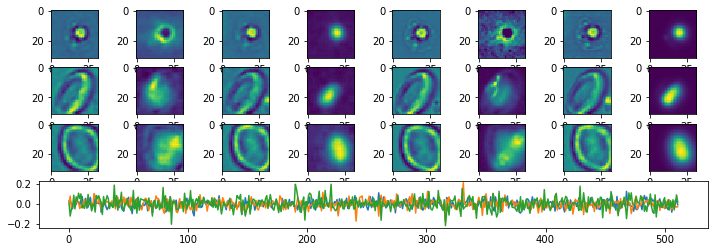

Epoch:  88 Iteration:  0 Loss:  2.11931 0.629282 0.000581086


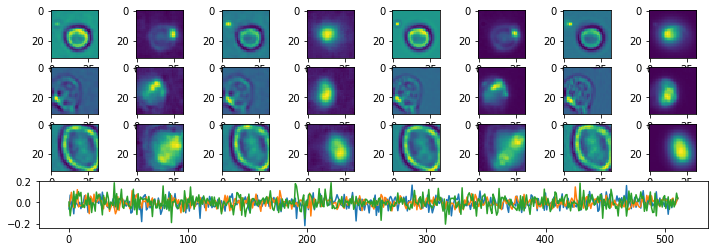

Epoch:  89 Iteration:  0 Loss:  10.3601 0.633581 0.00574723


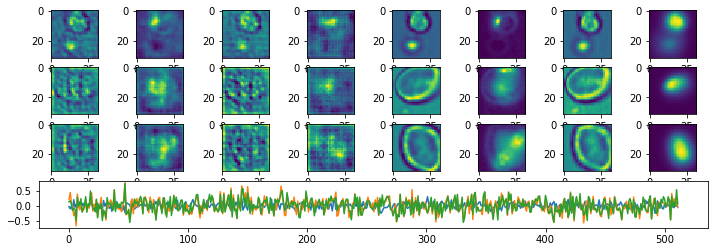

Epoch:  90 Iteration:  0 Loss:  2.79152 0.629636 0.000298351


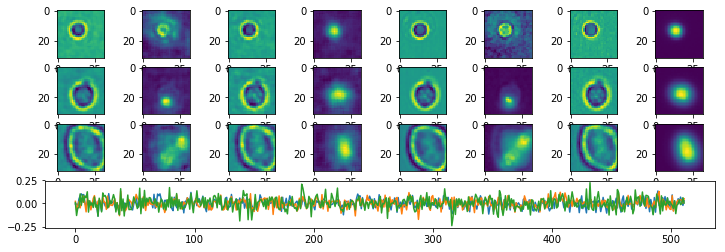

Epoch:  91 Iteration:  0 Loss:  2.51241 0.629489 0.000305921


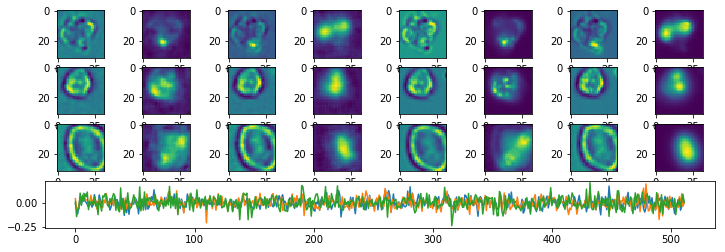

Epoch:  92 Iteration:  0 Loss:  2.39128 0.629425 0.000253677


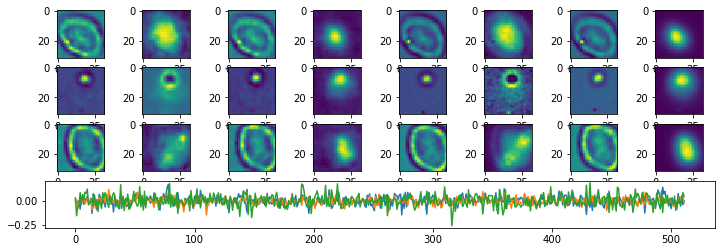

Epoch:  93 Iteration:  0 Loss:  2.30901 0.629381 0.000190675


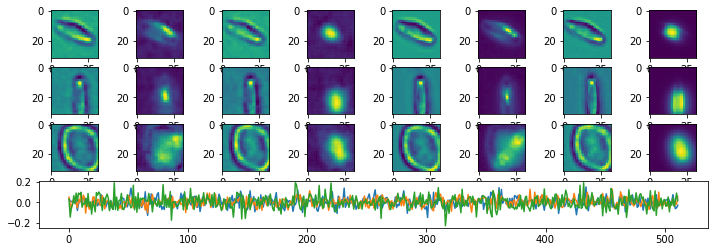

Epoch:  94 Iteration:  0 Loss:  2.27678 0.629367 0.000260115


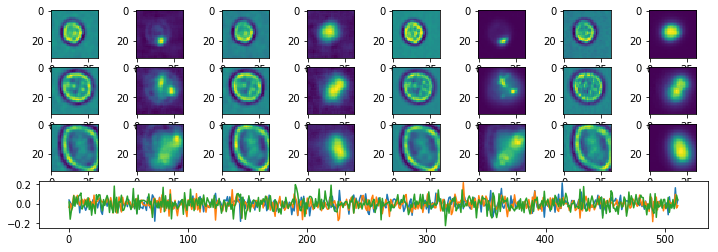

Epoch:  95 Iteration:  0 Loss:  2.23864 0.629346 0.00020507


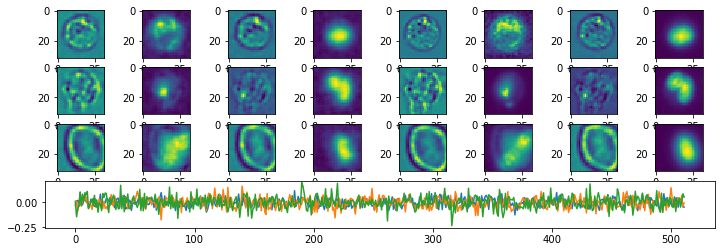

Epoch:  96 Iteration:  0 Loss:  2.20906 0.629328 0.000216931


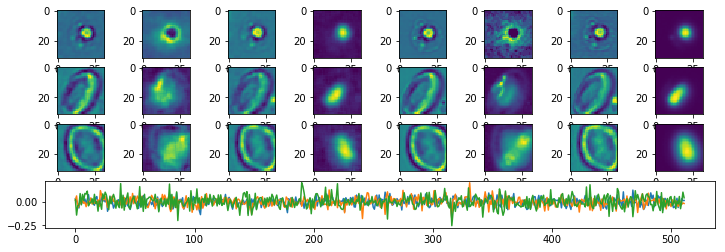

Epoch:  97 Iteration:  0 Loss:  2.19742 0.629328 0.000186771


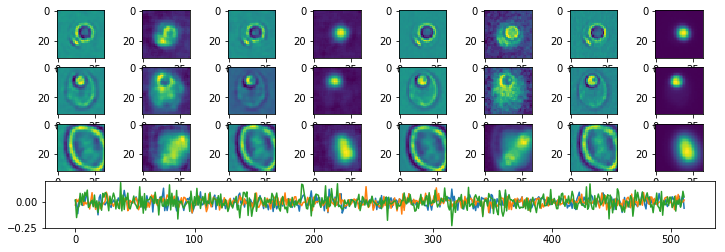

Epoch:  98 Iteration:  0 Loss:  2.16717 0.629308 0.000178039


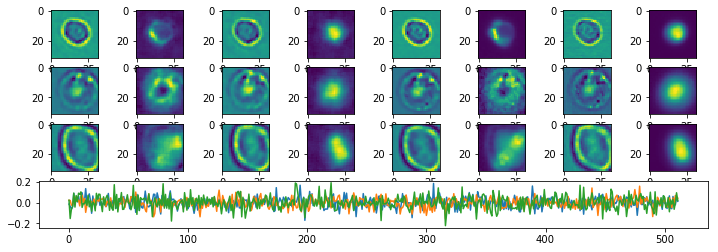

Epoch:  99 Iteration:  0 Loss:  2.17584 0.629314 0.00024119


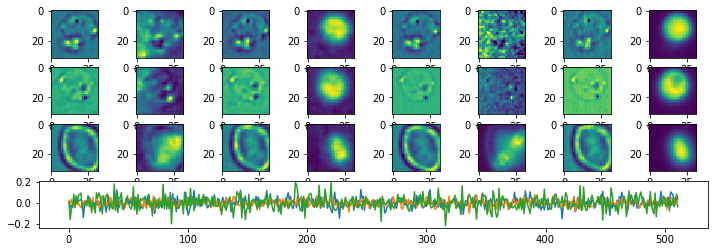

Epoch:  100 Iteration:  0 Loss:  2.15165 0.6293 0.000228733


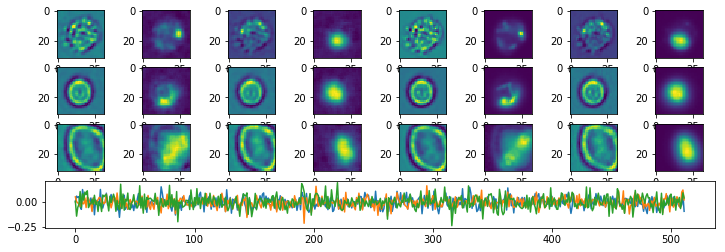

Epoch:  101 Iteration:  0 Loss:  2.14695 0.629295 0.000196785


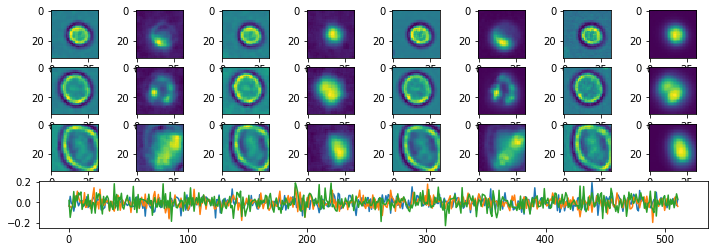

Epoch:  102 Iteration:  0 Loss:  2.12523 0.629286 0.00022155


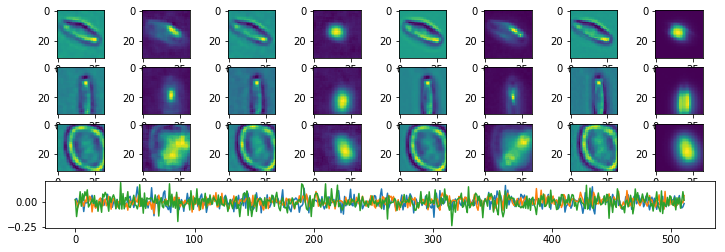

Epoch:  103 Iteration:  0 Loss:  2.1335 0.629293 0.000264823


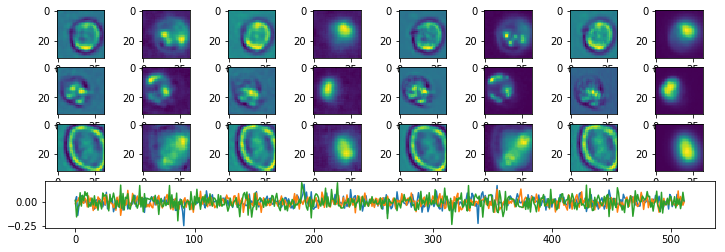

Epoch:  104 Iteration:  0 Loss:  2.10773 0.629278 0.000233889


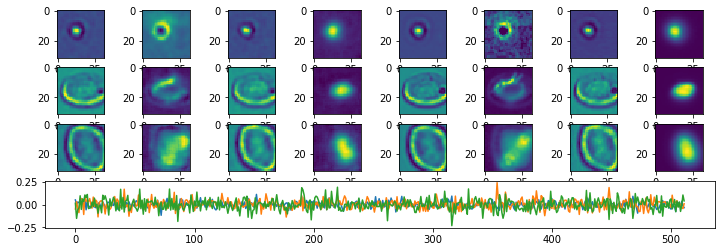

Epoch:  105 Iteration:  0 Loss:  2.0944 0.629268 0.000188529


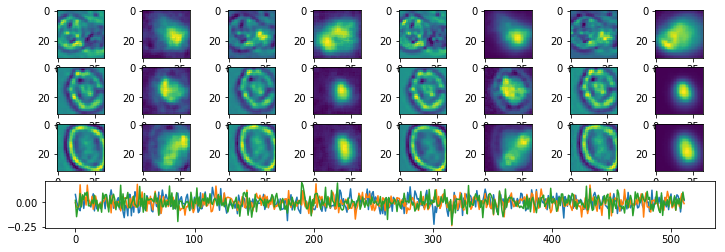

Epoch:  106 Iteration:  0 Loss:  2.1041 0.629277 0.000233114


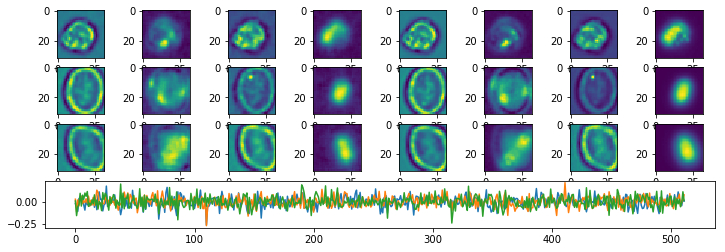

Epoch:  107 Iteration:  0 Loss:  2.09658 0.629269 0.000173688


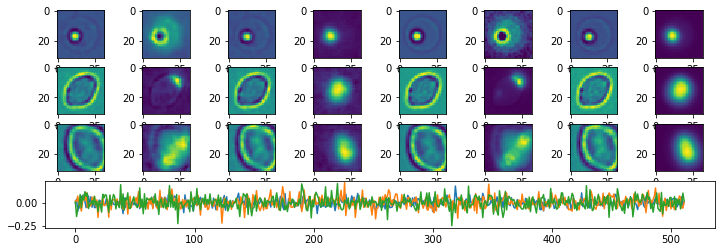

Epoch:  108 Iteration:  0 Loss:  2.10656 0.629275 0.000186294


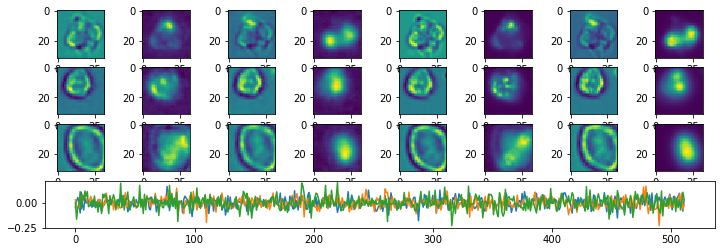

Epoch:  109 Iteration:  0 Loss:  2.09838 0.629274 0.000213146


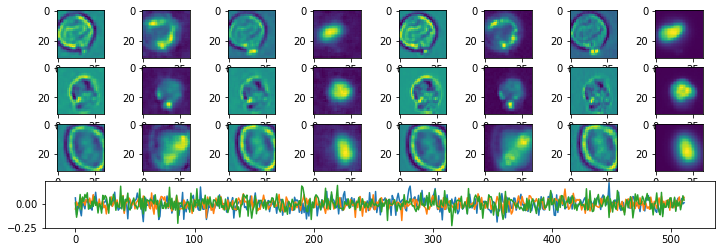

Epoch:  110 Iteration:  0 Loss:  2.08914 0.629268 0.000265539


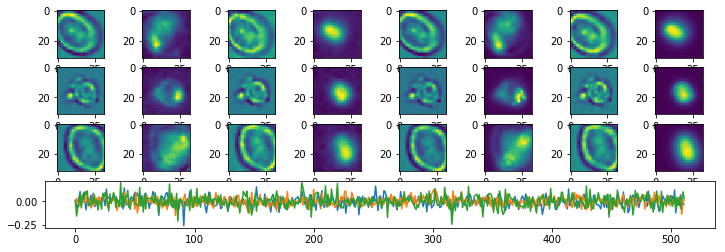

Epoch:  111 Iteration:  0 Loss:  2.08139 0.629263 0.000139385


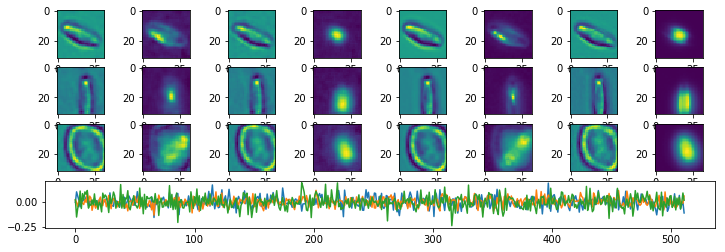

Epoch:  112 Iteration:  0 Loss:  2.06891 0.629255 0.000174016


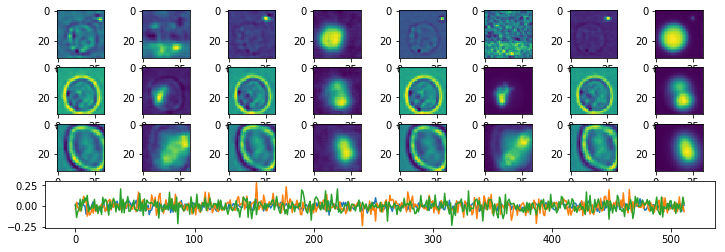

Epoch:  113 Iteration:  0 Loss:  2.07748 0.629261 6.55651e-05


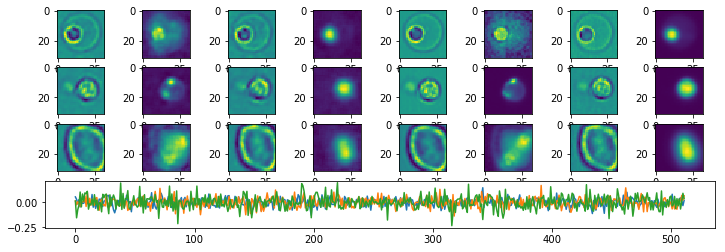

Epoch:  114 Iteration:  0 Loss:  2.07537 0.629259 0.0002141


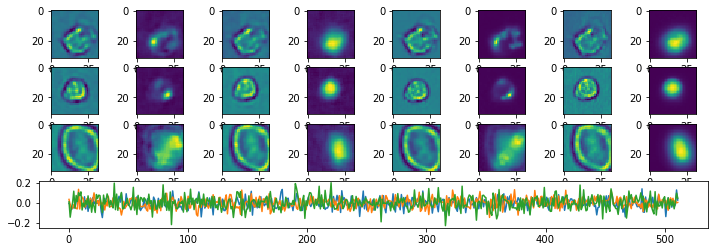

Epoch:  115 Iteration:  0 Loss:  2.06102 0.629254 0.000115156


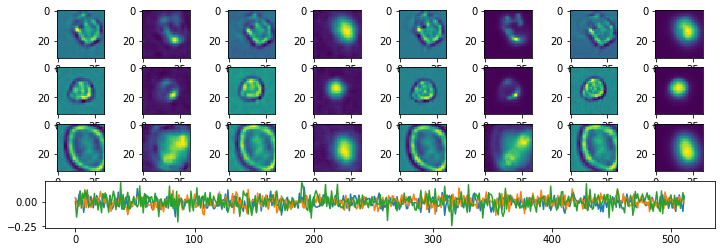

Epoch:  116 Iteration:  0 Loss:  2.05834 0.629251 0.000285953


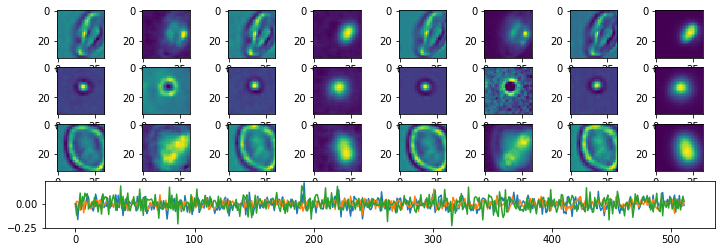

Epoch:  117 Iteration:  0 Loss:  2.06882 0.629257 9.42051e-05


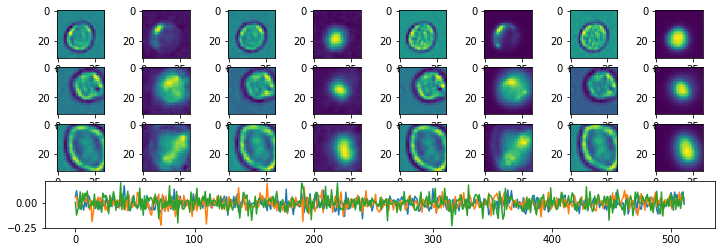

Epoch:  118 Iteration:  0 Loss:  2.04906 0.629246 0.000430882


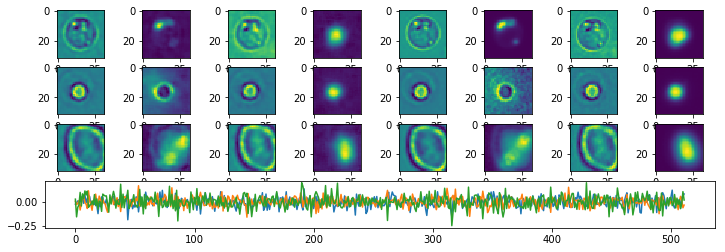

Epoch:  119 Iteration:  0 Loss:  2.04736 0.629245 0.000408173


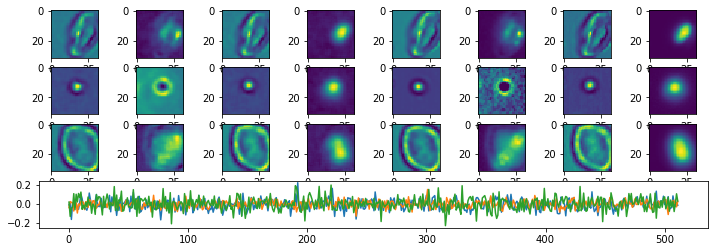

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 512 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-26-LS512"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4